#Buckley-Leverett

This notebook aims to generate a PINN (_Physics Informed Neural Network_) for solving the _Buckley-Leverett_ equation and compare its result with the analytical solution.
 
_Buckley-Leverett_ is a conservation equation used to model two-phase flow in porous media and can be treated as solving the Partial Differential Equation (PDE):
 
<center>$u_t+(f_w)_x=0$</center>


Usually, this kind of equation admits several weak solutions and additional conditions have been imposed to select the "physically" relevant solution among the others. One of those conditions is the so called "Oleinik's entropy condition", we'll see below.

We will consider the case of the non-convex flow function:

<center><h2>$f_w = \frac{u^2}{u^2+ \frac{(1-u)^2}{M}}$</h2></center>


where $M$ is the ratio between the viscosities we consider to be $1$ and with the following initial boundary conditions:

$u(x,t)=0,\space ∀x \space$ and $t=0$

$u(x,t)=1,\space x=0 \space$ and $t>0$

with $x \in [0,1] $ and $t \in [0,1]$.

This configuration follows the pattern indicated in the study article [1] in item 4.2.

For PINN we used the SimulAI tool developed by IBM [2].

In this _notebook_ we will use the strategy described in item 4.3 of article [4] by constructing a Convex-Hull with RAR.

$\space$


## References
 
[1] Fuks, Olga and Tchelepi, Hamdi A. "Limitations of physics informed machine learning for nonlinear two-phase transport in porous media." Journal of Machine Learning for Modeling and Computing 1.1 (2020).
 
[2] IBM. SimulAI Toolkit: A Python Package with Data-Driven Pipelines for Physics-Informed Machine Learning. 2022, doi:10.5281/zenodo.7351516.

[3] Lie, Henrik Syversveen. TMA4212 Buckley-Leverett report. Personal GitHub. Avaliable in: https://github.com/henrisli/Buckley-Leverett/blob/master/TMA4212%20Buckley-Leverett%20report.pdf. Accessed in: 06 Apr 2023.

[4] Diab, Waleed, and Mohammed Al Kobaisi. "PINNs for the Solution of the Hyperbolic Buckley-Leverett Problem with a Non-convex Flux Function." arXiv preprint arXiv:2112.14826 (2021).
## Authors

*  João Lucas de Sousa Almeida (Research Software Engineer and Data Scientist, IBM)
*  Nicole Pan Tavares (nicoleptav@gmail.com)
*  Wilson Bagni Junior (www.ic.unicamp.br/~wbagni)

## Code

In [ ]:
# This code is designed to be used in the Google 
# Colaboratory environment (https://colab.research.google.com/). Adjustments may 
# be made to run it in other environments 

# Installing the SimulAI tool

!pip install simulai-toolkit -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.9/213.9 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 MB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.2/77.2 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.7/365.7 kB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.9/212.9 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 5.8 MB/s eta 0:00:00


In [ ]:
# Imports that will be used during code execution

#%%capture 

import sympy as sp
import numpy as np
import torch
import matplotlib.pyplot as plt
from simulai.optimization import Optimizer
from simulai.residuals import SymbolicOperator

# Imports to neural network
from simulai.models import ImprovedDenseNetwork
from simulai.regression import SLFNN, ConvexDenseNetwork, DenseNetwork
from simulai.tokens import D
from simulai.file import SPFile


# Imports for visualization and animation
from matplotlib import animation, rc
from IPython.display import HTML 

# Setting seed to aid reproducibility
np.random.seed(1234)

/usr/local/lib/python3.10/dist-packages/simulai/regression/_opinf.py:33: UserWarning: Trying to import MPI in /usr/local/lib/python3.10/dist-packages/simulai/regression/_opinf.py.
  warnings.warn(f"Trying to import MPI in {__file__}.")
/usr/local/lib/python3.10/dist-packages/simulai/regression/_opinf.py:34: UserWarning: mpi4py is not installed. If you want to execute MPI jobs, we recommend you install it.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/simulai/parallel.py:24: UserWarning: Trying to import MPI in /usr/local/lib/python3.10/dist-packages/simulai/parallel.py.
  warnings.warn(f"Trying to import MPI in {__file__}.")
/usr/local/lib/python3.10/dist-packages/simulai/parallel.py:25: UserWarning: mpi4py is not installed. If you want to execute MPI jobs, we recommend you install it.
  warnings.warn(


### Analytical Solution

For the configuration shown, we can use the following analytical solution [3] below considering that $ξ= x/t$:



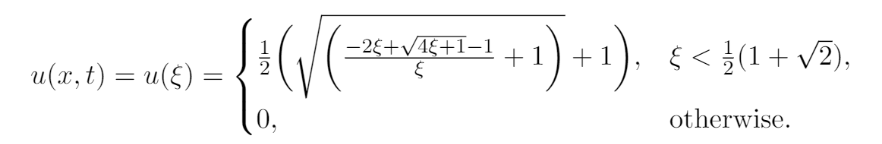

At the end of the execution of the code below we will have a $u\_n$ matrix of dimensions $(nt,nx)$, composed of $nt$ measurements in time and $nx$ measurements in space that make up the chosen _grid_.

In [ ]:
# Solution parameters and dataset building

nx = 401  # Number of points to be plotted
dx = 1./(nx-1) # Distance between each plotted point
nt = 301  # Number of points in which the time will be divided (snapshots)
dt = 1./(nt-1)  # Time between snapshots


def u_analytic(x,t):
  u_value = 0
  if t == 0:
    u_value = 0
  elif x == 0 and t > 0:
    u_value = 1
  elif x < (1/2)*(1+np.sqrt(2))*t:
    e = x/t
    u_value = (1/2)*(np.sqrt((-2*e+np.sqrt(4*e+1)-1)/e +1)+1)
 
  return u_value

u_n = np.zeros((nt,nx)) # Matrix of nt rows and nx columns
for i in range(nt):
    for j in range(nx):
          u_n[i,j] = u_analytic(j*dx, i*dt)

### PINN - Convex-Hull

For nonconvex scalar conservation laws, it is possible to write (Oleinik entropy condition):
$\space$

 <h2> $ \frac{f(u) - f(u_l)}{u-u_l} ≥ σ \ge \frac{f(u) - f(u_r)}{u-u_r} $ </h2>
$\space$
where $u_{l,r}$ are saturation values just before and after the discontinuity and $𝜎$ is the shock speed defined as:
$\space$

$σ = f'(u^*)=\frac{f(u^*)}{u^*}$

$\space$

So, we are looking for a spefic $u$ (called $u^*$) that solves:

$f_w'(u^*) - \frac{f_w(u^*)}{u^*} =0$

$\space$

The solution is:

$u^* = \sqrt{\frac{1}{(1+M)}} $ (check the appendix)

$\space$

In the PDE we will change $f_w$ for $\tilde{f}_w$, written as:


$\tilde{f}_w(u) = \left\{
\begin{array}{ll}
σ u &&&& 0\leq u < u^* \\
f_w(u) &&&& u \ge u^*
\end{array}
\right.$

$\space$

And we will solve the new PDE:

$u_t+(\tilde{f}_w)_x=0$

In [ ]:
# Parameter Setting

N = 10_000 
n = 100
T_max = 1
x_max = 1

g_1 = 'u-1' # Boundary condition

# Constant
M = 1

#############################
# Dealing with hyperbolicity
#############################
def f_w(u):
    return  (u**2)/(u**2+((1-u)**2)/M)


u_star = np.sqrt(1/(1+M))
sigma = f_w(u_star)/u_star

def f_w_tilde(u):
    return torch.where(u < u_star,
                       sigma*u,
                       f_w(u)
                      )
############################


In [ ]:
# Network Parameter Settings

input_labels = ["x", "t"]
output_labels = ["u"]
n_inputs = len(input_labels)
n_outputs = len(output_labels)
n_epochs = 50000 
lr = 1e-3 

boundary_penalties = [1]
weights_residual =  [1]
initial_penalty = 1

# PDE training and test set definition
x_eval = (np.random.rand(N) * x_max)[:, None]
time_eval = (np.random.rand(N) * T_max)[:, None]

# Regular grid
X_DIM = 100
T_DIM = 100

dx = (x_max) / X_DIM
dt_ = (T_max) / T_DIM

grid = np.mgrid[dt_ : T_max + dt_ : dt_, 0:x_max:dx]

X_train = np.hstack([grid[1].flatten()[:, None], grid[0].flatten()[:, None]])

In [ ]:
# Dataset Definition for Initial Condition
# u=0 at t=0 for any x

x_init = np.linspace(0, x_max, 3*n)[:, None]
t_init = np.zeros(3*n)[:, None]

data_initial = np.hstack([x_init, t_init])

u_initial = np.zeros(3*n)[:, None]

# Data definition for boundary condition
# For t>0, u=1 for x=0.

x_bc = np.zeros(3*n)[:, None] 
t_bc = np.linspace(1e-8, T_max, 3*n)[:, None]

data_bc = np.hstack([x_bc, t_bc])

In [ ]:
# Setting the function that will build the training net
# It is possible to choose two different types of networks

def model(net_type="Dense"):

  # If it is a fully connected network
 
  if net_type=="Dense":

    # Configuration for the fully-connected network
    config = {
        "layers_units": 6*[128],
        "activations": "tanh",
        "input_size": 2,
        "output_size": 1,
        "name": "net",
    }

    # Instantiating and training the surrogate model
    net = DenseNetwork(**config)

    return net

  # If you want to use the ImprovedDenseNetwork
  elif(net_type=="Improved"):

    # Configuration for the ImprovedDenseNetwork
    config = {
        "layers_units": 6*[128],
        "activations": "elu",
        "input_size": 2,
        "output_size": 1,
        "name": "net",
    }

    # Instantiating and training the surrogate model
    densenet = ConvexDenseNetwork(**config)
    encoder_u = SLFNN(input_size=n_inputs, output_size=128, activation="tanh")
    encoder_v = SLFNN(input_size=n_inputs, output_size=128, activation="tanh")

    net = ImprovedDenseNetwork(
        network=densenet,
        encoder_u=encoder_u,
        encoder_v=encoder_v,
        devices="gpu",
    )

    return net

In [ ]:
# PDE

f = "D(u, t) + D(f_w_tilde(u), x)"

# Network
net = model("Dense")

# Residual

residual = SymbolicOperator(
    expressions=[f],
    input_vars=["x","t"],
    output_vars=["u"],
    auxiliary_expressions={'x_bc': g_1},
    external_functions={'f_w_tilde': f_w_tilde},
    constants = {'M': M},
    function=net,
    engine="torch",
    device="gpu",
)


params = {
    "residual": residual,
    "initial_input": data_initial,
    "initial_state": u_initial,
    'boundary_input': {'x_bc': data_bc},
    'boundary_penalties': boundary_penalties,
    "weights_residual": weights_residual,
    "initial_penalty": initial_penalty,
}


optimizer_config = {"lr": lr}
optimizer = Optimizer("adam", params=optimizer_config,
                      lr_decay_scheduler_params={'name': 'ExponentialLR',
                                                 'gamma': 0.8,
                                                 'decay_frequency': 2_500,
                                                 'verbose': True},
                     shuffle=False)


Using GPU.
Optimizer adam found in torch.optim.


In [ ]:
optimizer.fit(
    op=net,
    input_data= X_train,
    n_epochs=n_epochs,
    loss="pirmse",
    params=params,
    device="gpu",
)

# Saving model for future use if necessary
saver = SPFile(compact=False)
saver.write(save_dir='./', name="buckley_leverett_hyperbolic", model=net, template=model)


Using GPU.
Using LR decay <class 'torch.optim.lr_scheduler.ExponentialLR'>.
Adjusting learning rate of group 0 to 1.0000e-03.
Data transferred to GPU.
pde:0.0010597184300422668 init:0.002739632735028863 bound:0.0032240140717476606 Adjusting learning rate of group 0 to 8.0000e-04.
pde:0.0015837876126170158 init:0.0070427474565804005 bound:0.0007331891683861613 Adjusting learning rate of group 0 to 6.4000e-04.
pde:0.0033328994177281857 init:0.005827668122947216 bound:0.008863252587616444 Adjusting learning rate of group 0 to 5.1200e-04.
pde:0.00042952026706188917 init:0.0010609605815261602 bound:0.0021294832695275545 Adjusting learning rate of group 0 to 4.0960e-04.
pde:0.0006312456098385155 init:0.0006541123730130494 bound:0.0013972438173368573 Adjusting learning rate of group 0 to 3.2768e-04.
pde:0.00017952661437448114 init:0.001228352077305317 bound:0.0013823691988363862 Adjusting learning rate of group 0 to 2.6214e-04.
pde:0.0006097840378060937 init:0.0009952688124030828 bound:0.0018

### Analysis and Charts

In [ ]:
# If the next cell gives an error like "RuntimeError: Expected all tensors 
# to be on the same device, but found at least two devices, cuda:0 and cpu! 
# (when checking # argument for argument mat1 in method wrapper_CUDA_addmm)"
# to the "eval" then adapt and use the code below passing everything to CPU
# or GPU depending on the colab resource

#net.to("cuda")


net.to("cpu")

DenseNetwork(
  (net_input): Linear(in_features=2, out_features=128, bias=True)
  (net_0): Linear(in_features=128, out_features=128, bias=True)
  (net_1): Linear(in_features=128, out_features=128, bias=True)
  (net_2): Linear(in_features=128, out_features=128, bias=True)
  (net_3): Linear(in_features=128, out_features=128, bias=True)
  (net_4): Linear(in_features=128, out_features=128, bias=True)
  (net_5): Linear(in_features=128, out_features=1, bias=True)
)

In [ ]:
# This cell creates an array with PINN solutions in the same grid
# used for the analytical solution

u_n_pinn = np.zeros((nt,nx)) # Matrix of nt rows and nx columns

for n in range(0,nt): 
  x_plot = np.linspace(0, x_max, nx)[:, None]
  t_plot = ((n * dt)*np.ones(nx))[:, None]
  data_plot = np.hstack([x_plot, t_plot])
  u_approximated_plot = net.eval(input_data=np.hstack([x_plot, t_plot]))
  u_n_pinn[n] = u_approximated_plot.flatten()

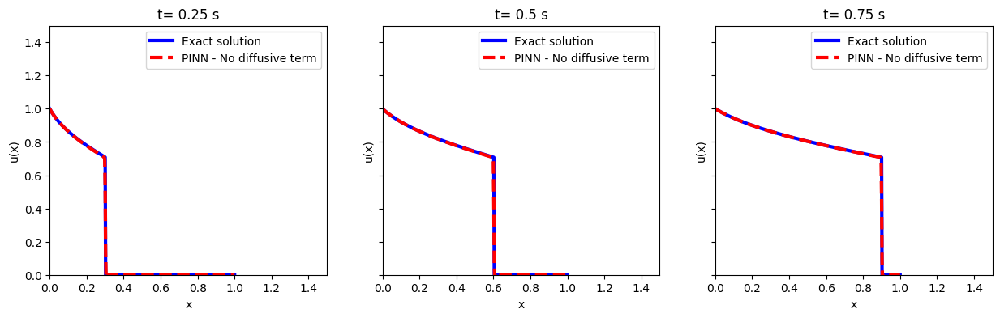

In [ ]:
# Plots the chart of PINN with and without diffusion term together with the
# analytical solution


fig, axs = plt.subplots(1, 3, sharey=True,  figsize=(15, 4))

t_especific = [0.25, 0.5,0.75]

index = int(t_especific[0]/dt)
axs[0].plot(np.linspace(0,1,nx), u_n[index],color='blue' , ls='-', lw=3, label="Exact solution")
axs[0].plot(x_plot,  u_n_pinn[index], color='red', ls='--', lw=3,  label="PINN - No diffusive term")

axs[0].set_title("t= " + str(t_especific[0]) + " s")
axs[0].set_ylim(0,1.5)
axs[0].set_xlim(0,1.5)
axs[0].legend()


index = int(t_especific[1]/dt)
axs[1].set_title("t= " + str(t_especific[1]) + " s")
axs[1].plot(np.linspace(0,1,nx), u_n[index],color='blue' , ls='-', lw=3, label="Exact solution")
axs[1].plot(x_plot,  u_n_pinn[index], color='red', ls='--', lw=3,  label="PINN - No diffusive term")


axs[1].legend()
axs[1].set_ylim(0,1.5)
axs[1].set_xlim(0,1.5)

index = int(t_especific[2]/dt)
axs[2].set_title("t= " + str(t_especific[2]) + " s")
axs[2].plot(np.linspace(0,1,nx), u_n[index],color='blue' , ls='-', lw=3, label="Exact solution")
axs[2].plot(x_plot,  u_n_pinn[index], color='red', ls='--', lw=3,  label="PINN - No diffusive term")


axs[2].legend()
axs[2].set_ylim(0,1.5)
axs[2].set_xlim(0,1.5)

for ax in axs.flat:
    ax.set(xlabel='x', ylabel='u(x)')
    
plt.savefig("snapshot.png")
plt.show()

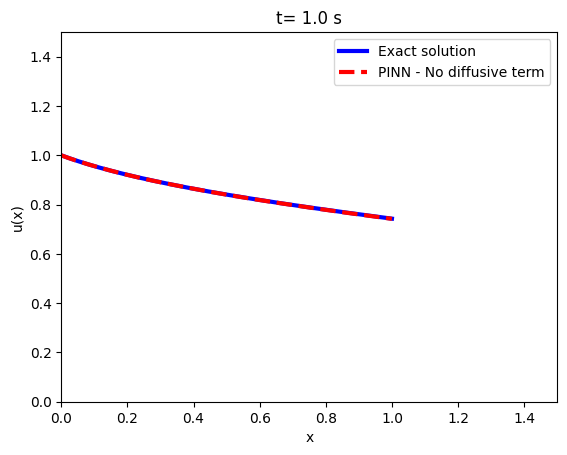

In [ ]:
fig = plt.figure()
ax = plt.axes(xlim=(0.0,1.5),ylim=(0.0,1.5),xlabel=('x'),ylabel=('u(x)'))
line = ax.plot([], [], color='blue', ls='-', lw=3, label="Exact solution")[0]
line2 = ax.plot([], [], color='red', ls='--', lw=3, label="PINN - No diffusive term")[0]


def init():
    line.set_data([], [])
    line2.set_data([], [])
    return line, line2

def animate(i):
    x = np.linspace(0.0,1,nx)
    y = u_n[i,:].copy()
    y2 = u_n_pinn[i,:].copy()
    line.set_data(x,y)   
    line2.set_data(x,y2)   
    plt.title("t= " + str(round(i*dt,2)) + " s")
    plt.legend()
    return line,line2
    
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=nt, interval=100, blit=True)

rc('animation', html='jshtml')


# Save animation as a gif file
anim.save("result.gif", writer="pillow") 

anim

In [ ]:
# Analysis on the test set

#Exact solution
u_exact = np.zeros(N)
i=0
for x,t in zip(x_eval, time_eval):
    u_exact[i]= u_analytic(x,t)
    i=i+1

# PINN Solution

u_approximated_eval = net.eval(input_data=np.hstack([x_eval, time_eval]))

In [ ]:
# Root Mean Square Error

error_pinn = np.sqrt(np.mean((u_approximated_eval.flatten()-u_exact)**2))

print("The RMSE of the PINN without diffusive term was: ", error_pinn)


The RMSE of the PINN without diffusive term was:  0.014291824429533785


## Appendix

### Finding $u^*$:

In [ ]:
u, M = sp.symbols('u M')
f = u**2/(u**2 + (1-u)**2/M)

In [ ]:
sp.solve(f.diff(u) - f/u, u)

[0, -sqrt(1/(M + 1)), sqrt(1/(M + 1))]

The only viable and acceptable solution: 
$ u^* = \frac{1}{\sqrt{1+M}} $